In [2]:
from stable_baselines3 import DQN


In [3]:
from gymnasium import make
from gymnasium.wrappers import FlattenObservation
from stable_baselines3.common.callbacks import EvalCallback

# make + flatten
env = make("Blackjack-v1", natural=False, sab=True)
env = FlattenObservation(env)

# create an eval callback that will record eval rewards every 10k steps
eval_callback = EvalCallback(
    env,
    eval_freq=100,
    log_path="./eval_logs/",  # where evaluations.npz will be saved
    deterministic=True,
    verbose=1,
)

model = DQN(
    "MlpPolicy",
    env,
    learning_rate=1e-3,
    buffer_size=10_000,
    learning_starts=1_000,
    batch_size=512,
    gamma=0.99,
    verbose=1,
    tensorboard_log="./tb_logs/",  # enable loss logging
)

model.learn(total_timesteps=100_000, callback=eval_callback)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to ./tb_logs/DQN_5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1        |
|    ep_rew_mean      | -0.5     |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 443      |
|    time_elapsed     | 0        |
|    total_timesteps  | 4        |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.12     |
|    ep_rew_mean      | -0.5     |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 669      |
|    time_elapsed     | 0        |
|    total_timesteps  | 9        |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.17     |
|  

/bmrc-an-data/Chunxu/blackjack-rl/.venv/lib/python3.12/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.33     |
|    ep_rew_mean      | -0.39    |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 152      |
|    fps              | 621      |
|    time_elapsed     | 0        |
|    total_timesteps  | 196      |
----------------------------------
Eval num_timesteps=200, episode_reward=0.20 +/- 0.98
Episode length: 1.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 1        |
|    mean_reward      | 0.2      |
| rollout/            |          |
|    exploration_rate | 0.981    |
| time/               |          |
|    total_timesteps  | 200      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 1.33     |
|    ep_rew_mean      | -0.42    |
|    exploration_rate | 0.981    |
| time/               |          |
|    ep

In [44]:
ea.accumulated_attrs

('scalars', 'histograms', 'compressed_histograms', 'images', 'audios')

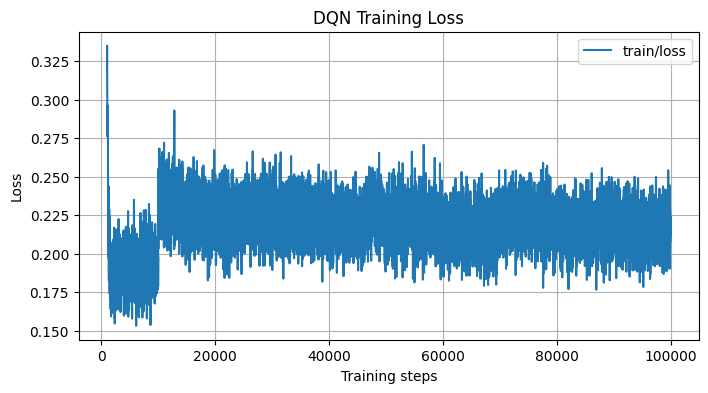

In [43]:
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing import event_accumulator

log_dir = "/bmrc-an-data/Chunxu/blackjack-rl/src/blackjack-rl/tb_logs/DQN_5"

# load the events:
ea = event_accumulator.EventAccumulator(log_dir)
ea.Reload()

# extract all 'train/loss' scalars:
loss_events = ea.Scalars("train/loss")
steps = [e.step for e in loss_events]
losses = [e.value for e in loss_events]

# plot:
plt.figure(figsize=(8, 4))
plt.plot(steps, losses, label="train/loss", color="C0")
plt.xlabel("Training steps")
plt.ylabel("Loss")
plt.title("DQN Training Loss")
plt.grid(True)
plt.legend()
plt.show()

available tags: ['rollout/ep_len_mean', 'rollout/ep_rew_mean', 'rollout/exploration_rate', 'time/fps', 'eval/mean_ep_length', 'eval/mean_reward', 'train/learning_rate', 'train/loss']


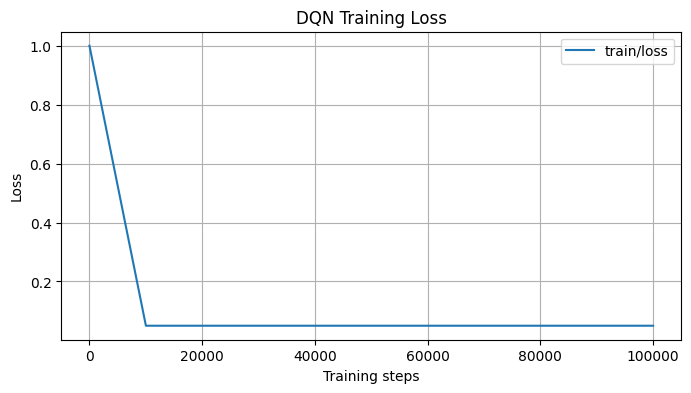

In [45]:
import os

# 1) find the actual run folder SB3 wrote into
root = "./tb_logs"
runs = [d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))]
if not runs:
    raise RuntimeError(f"no runs found in {root}")
run_dir = os.path.join(root, runs[-1])  # pick the last run

# 2) load events
ea = event_accumulator.EventAccumulator(run_dir)
ea.Reload()

# 3) list all scalar tags so you know the exact name
print("available tags:", ea.Tags()["scalars"])

# 4) plot the train/loss curve
# loss_events = ea.Scalars("train/loss")
loss_events = ea.Scalars("rollout/exploration_rate")
steps = [e.step for e in loss_events]
values = [e.value for e in loss_events]

plt.figure(figsize=(8, 4))
plt.plot(steps, values, label="train/loss", color="C0")
plt.xlabel("Training steps")
plt.ylabel("Loss")
plt.title("DQN Training Loss")
plt.grid(True)
plt.legend()
plt.show()

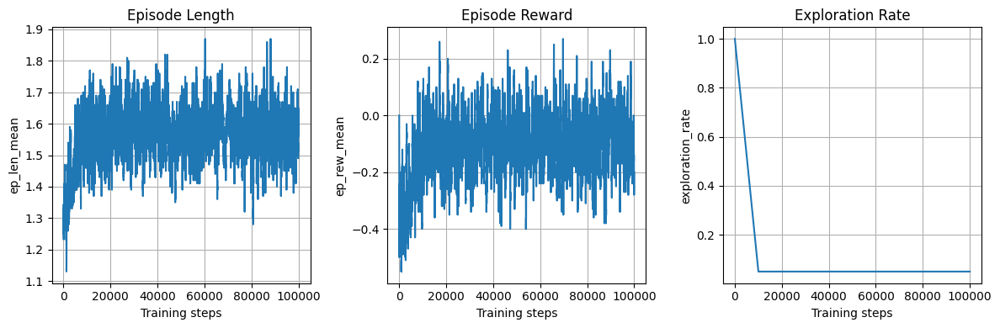

In [46]:
# 1) locate the latest run
root = "./tb_logs"
runs = [d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))]
run_dir = os.path.join(root, runs[-1])

# 2) load events
ea = event_accumulator.EventAccumulator(run_dir)
ea.Reload()

# 3) tags to plot
tags = ["rollout/ep_len_mean", "rollout/ep_rew_mean", "rollout/exploration_rate"]
display_tags = ["Episode Length", "Episode Reward", "Exploration Rate"]
# 4) extract data
data = {}
for tag in tags:
    evs = ea.Scalars(tag)
    steps = [e.step for e in evs]
    vals = [e.value for e in evs]
    data[tag] = (steps, vals)

# 5) plot
fig, axs = plt.subplots(1, len(tags), figsize=(12, 4))
for ax, tag, d in zip(axs, tags, display_tags):
    steps, vals = data[tag]
    ax.plot(steps, vals)
    ax.set_title(d)
    ax.set_xlabel("Training steps")
    ax.set_ylabel(tag.split("/")[-1])
    ax.grid(True)

plt.tight_layout()
plt.show()

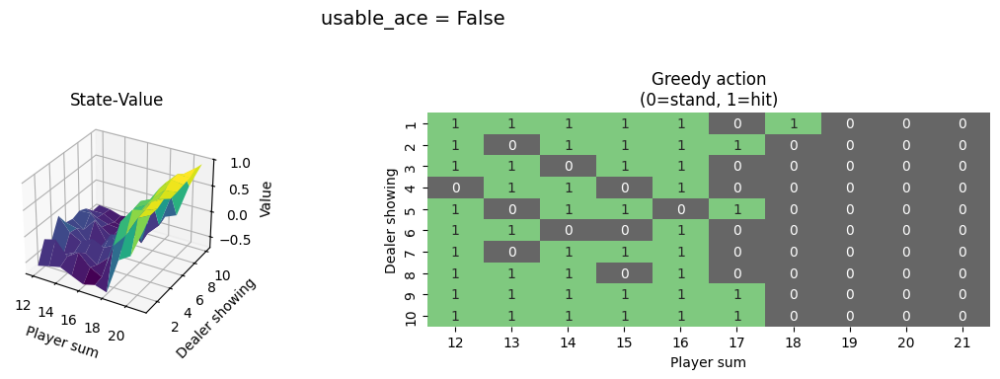

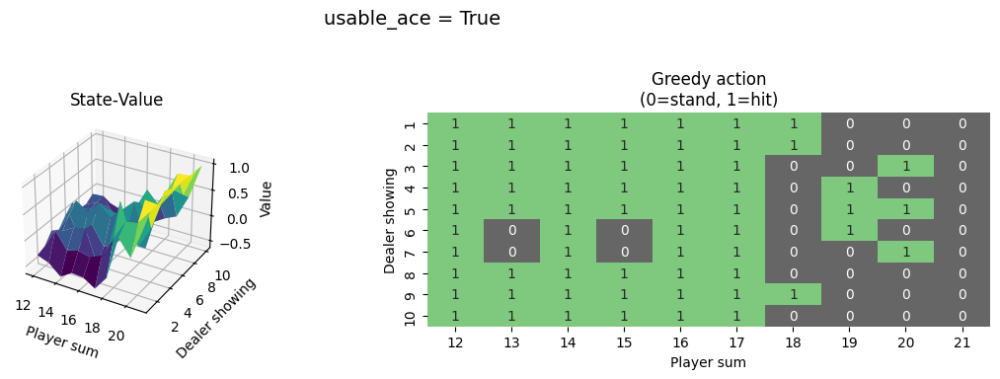

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch

# ranges for the two axes
player_range = np.arange(12, 22)
dealer_range = np.arange(1, 11)
P, D = np.meshgrid(player_range, dealer_range)

for usable in [False, True]:
    # allocate
    values = np.zeros_like(P, dtype=float)
    policy = np.zeros_like(P, dtype=int)

    # fill in
    for i, p in enumerate(player_range):
        for j, d in enumerate(dealer_range):
            obs_tuple = (p, d, usable)
            # this returns the one‑hot 45‑vector thanks to FlattenObservation
            x45 = env.observation(obs_tuple)
            # to tensor, add batch dim
            t = torch.tensor(x45, device=model.device).unsqueeze(0)
            with torch.no_grad():
                # model.q_net includes the feature extractor + q‑head
                q_values = model.q_net(t).cpu().numpy()[0]
            policy[j, i] = int(q_values.argmax())
            values[j, i] = float(q_values.max())

    # plot
    fig = plt.figure(figsize=(12, 4))
    fig.suptitle(f"usable_ace = {usable}", fontsize=14)

    # value surface
    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax1.plot_surface(P, D, values, cmap="viridis", edgecolor="none")
    ax1.set_xlabel("Player sum")
    ax1.set_ylabel("Dealer showing")
    ax1.set_zlabel("Value")
    ax1.set_title("State‑Value")

    # policy heatmap
    ax2 = fig.add_subplot(1, 2, 2)
    sns.heatmap(
        policy,
        xticklabels=player_range,
        yticklabels=dealer_range,
        cmap="Accent_r",
        cbar=False,
        annot=True,
        fmt="d",
    )
    ax2.set_xlabel("Player sum")
    ax2.set_ylabel("Dealer showing")
    ax2.set_title("Greedy action\n(0=stand, 1=hit)")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [54]:
import numpy as np

n_episodes = 1000
wins = 0
losses = 0
draws = 0

# Make sure to use the same flattened env as during training
# env = make("Blackjack-v1", sab=True)
# env = FlattenObservation(env)

for _ in range(n_episodes):
    obs, info = env.reset()
    done = False
    while not done:
        # Use deterministic prediction for evaluation
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated

    # Tally results based on the final reward
    if reward > 0:
        wins += 1
    elif reward < 0:
        losses += 1
    else:
        draws += 1

total_games = wins + losses + draws
win_rate = wins / total_games
loss_rate = losses / total_games
draw_rate = draws / total_games

print(f"Results after {total_games} games:")
print(f"  Win rate: {win_rate:.2%}")
print(f"  Loss rate: {loss_rate:.2%}")
print(f"  Draw rate: {draw_rate:.2%}")

Results after 1000 games:
  Win rate: 42.20%
  Loss rate: 49.60%
  Draw rate: 8.20%
